# Multimodal Embeddings

* Using text AND image as input/output for similarities.

In [16]:
import scann
import base64
import requests
import vertexai
import requests
import vertexai
from io import BytesIO
import numpy as np
import pandas as pd
from PIL import Image as Img
from google.cloud import storage, aiplatform
import vertexai.generative_models as generative_models
from vertexai.vision_models import MultiModalEmbeddingModel, Image
from vertexai.generative_models import GenerativeModel, Part, FinishReason

In [5]:
storage_client = storage.Client()
vertexai.init(project="vtxdemos", location="us-central1")

In [6]:
model = GenerativeModel("gemini-1.5-flash-001",)
mm = MultiModalEmbeddingModel.from_pretrained("multimodalembedding")
df = pd.read_csv("gs://vtxdemos-vsearch-datasets/abnb_combined/combined_data.csv")

In [8]:
generation_config = {
    "max_output_tokens": 8192,
    "temperature": 1,
    "top_p": 0.95,
}

safety_settings = {
    generative_models.HarmCategory.HARM_CATEGORY_HATE_SPEECH: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
    generative_models.HarmCategory.HARM_CATEGORY_DANGEROUS_CONTENT: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
    generative_models.HarmCategory.HARM_CATEGORY_SEXUALLY_EXPLICIT: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
    generative_models.HarmCategory.HARM_CATEGORY_HARASSMENT: generative_models.HarmBlockThreshold.BLOCK_MEDIUM_AND_ABOVE,
}

weight_image = 0.6
weight_text = 0.4

## Dataset

In [10]:
id_list = []
context_list = []
embeddings = []

def llm(context: str):
    prompt = f"""
    Your task is to create a good description from the following context:
    
    <rules>
    1. The output will be used to generate multimodal embeddings (MultiModalEmbeddingModel) from vertexai.vision_models, description should fit on it.
    2. The end goal is to combine image and text embeddings, description should be according that.
    3. The maximum number of characters is 1024 so keep it simply but do not forget relevant information remember point number 1 and 2.

    </rules>
    
    <context>
    {context}
    
    </context>
    
    Output description:
    """
    
    response = model.generate_content(
      [prompt],
      generation_config=generation_config,
      safety_settings=safety_settings,
    )
    
    try:
        return response.text
    except:
        print("Error!")
        print(response)
        return ""
    
def l2_normalize(vector):
    """Normalizes a vector to unit length using L2 normalization."""
    l2_norm = np.linalg.norm(vector)
    if l2_norm == 0:
        return vector  # Avoid division by zero
    return vector / l2_norm
        
    
for index, row in df.iterrows():
    context = f'''
    The title of the airbnb listing is {row["title"]}, the location is {row["location"]}, the number of permissible guests are {row["guests"]},
    the number of bedrooms are: {row["bedrooms"]}, it has the following ratings: {row["rating"]}, and count with {row["reviews"]} reviews,
    the hostname is {row["host_name"]}, and the type of host is {row["host_type"]}, price per night is {row["price_per_night"]},
    and if the following value is 1 it means that is a rare find {row["is_rare_find"]}, amenities are: {row["amenities"]}, and the closest neighbourhoods are:
    {row["nearby_neighbourhood"]}.
    '''
    context = llm(context)
    print(context)
    if context == "":
        pass
    else:
        for im in ["Img_interior_url_", "Img_exterior_url_"]:
            for i in range(5):
                _img = row[f"{im}{i}"].replace("https://storage.googleapis.com/", "gs://")
                print(f"Processing {_img}")
                e = mm.get_embeddings(
                    image=Image(
                        gcs_uri=_img
                    ),
                    contextual_text=context,
                )
                
                normalized_text_embedding = l2_normalize(e.text_embedding)
                normalized_image_embedding = l2_normalize(e.image_embedding)
                we_ave =  (weight_image * normalized_image_embedding) + (weight_text * normalized_text_embedding)

                embeddings.append(we_ave)
                id_list.append(row["id"])
                context_list.append(context)

Cozy cabin in Asheville, North Carolina, perfect for 3 guests. 1 bedroom, 4.9 stars with 38 reviews. Hosted by new host Jane Doe, $164 per night. Amenities include bathtub, freezer, cleaning products, bed sheets, free washer, bed linens, dishwasher, and outdoor furniture. Located near Downtown and Lakes. 

Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_0.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_1.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_2.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_3.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207112748/sample_4.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_0.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_1.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages/1716207108999/sample_2.jpg
Processing gs://vtxdemos-vsearch-airbnb/airbnbimages

NotFound: 404 Image embedding failed with the following error: No such object: vtxdemos-vsearch-airbnb/airbnbimages/1716171369713/sample_0.jpg

In [11]:
emb_df = pd.DataFrame({"id": id_list, "context": context_list, "embedding": embeddings})

## Testing Locally

In [19]:
text_query = "a private balcony overlooking the Pacific Ocean, direct beach access"

txt = mm.get_embeddings(
    image=Image(image_bytes=requests.get("https://t3.ftcdn.net/jpg/02/80/11/26/360_F_280112608_32mLVErazmuz6OLyrz2dK4MgBULBUCSO.jpg").content),
    contextual_text=query
)

normalized_text_embedding = l2_normalize(txt.text_embedding)
normalized_image_embedding = l2_normalize(txt.image_embedding)
we_ave =  (weight_image * normalized_image_embedding) + (weight_text * normalized_text_embedding)

In [20]:
img = np.array([r["embedding"] for i, r in emb_df.iterrows()])
k = int(np.sqrt(df.shape[0]))

if int(k/20) < 1:
    leave_search = 1
else:
    leave_search = int(k/20)

searcher = scann.scann_ops_pybind.builder(img, num_neighbors=15, distance_measure="dot_product").tree(
    num_leaves=k, num_leaves_to_search=leave_search, training_sample_size=emb_df.shape[0]).score_brute_force(
    2).reorder(10).build()

2024-05-27 02:28:28.244575: I scann/partitioning/partitioner_factory_base.cc:59] Size of sampled dataset for training partition: 1220
2024-05-27 02:28:28.277949: W scann/utils/gmm_utils.cc:921] Could not normalize centroid due to zero norm or empty or zero-weight partition.
2024-05-27 02:28:28.296655: I ./scann/partitioning/kmeans_tree_partitioner_utils.h:88] PartitionerFactory ran in 51.787664ms.


In [21]:
neighbors, distances = searcher.search(we_ave, final_num_neighbors=5)

nn_list = emb_df.loc[neighbors,:]["id"].unique().tolist()
order_df = pd.DataFrame({'id': nn_list})
merged_df = df.merge(order_df, on='id', how='inner')
final_df = merged_df.set_index('id').loc[nn_list].reset_index()

Img_interior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716207003174/sample_0.jpg


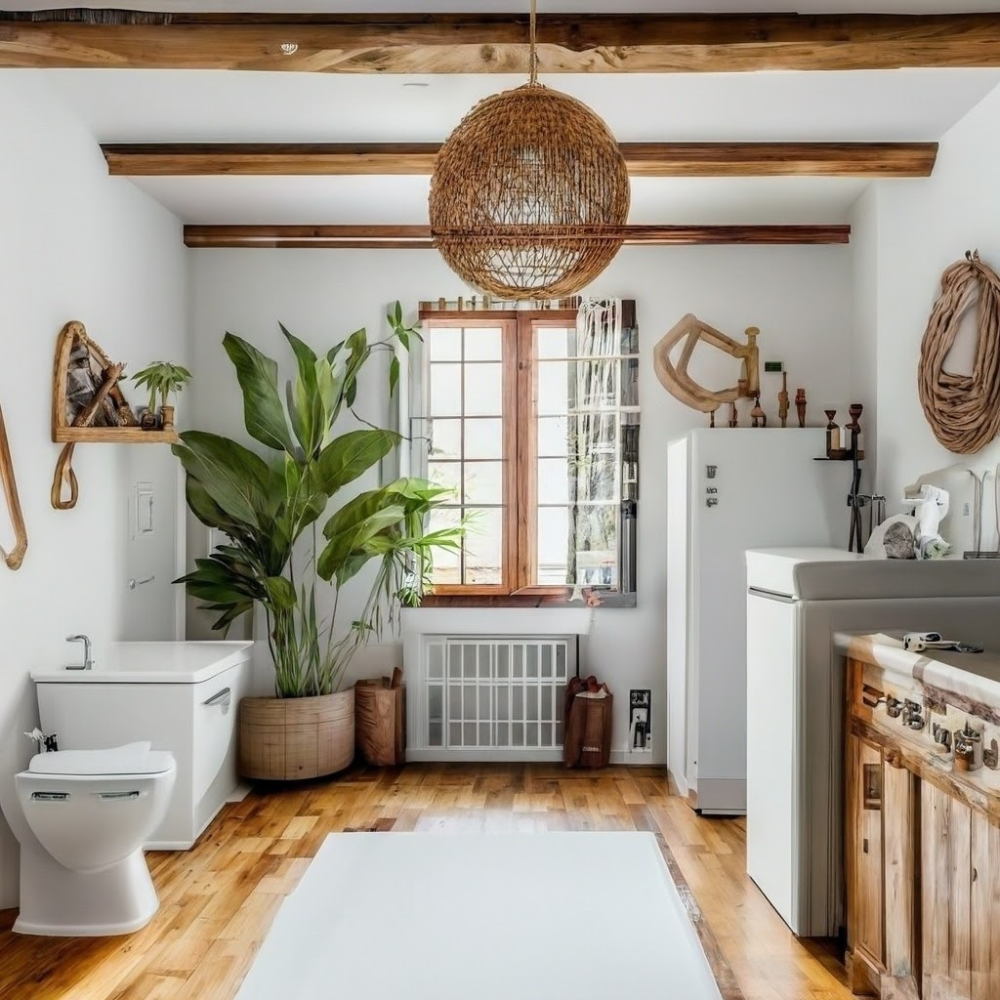

Img_exterior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716206999048/sample_0.jpg


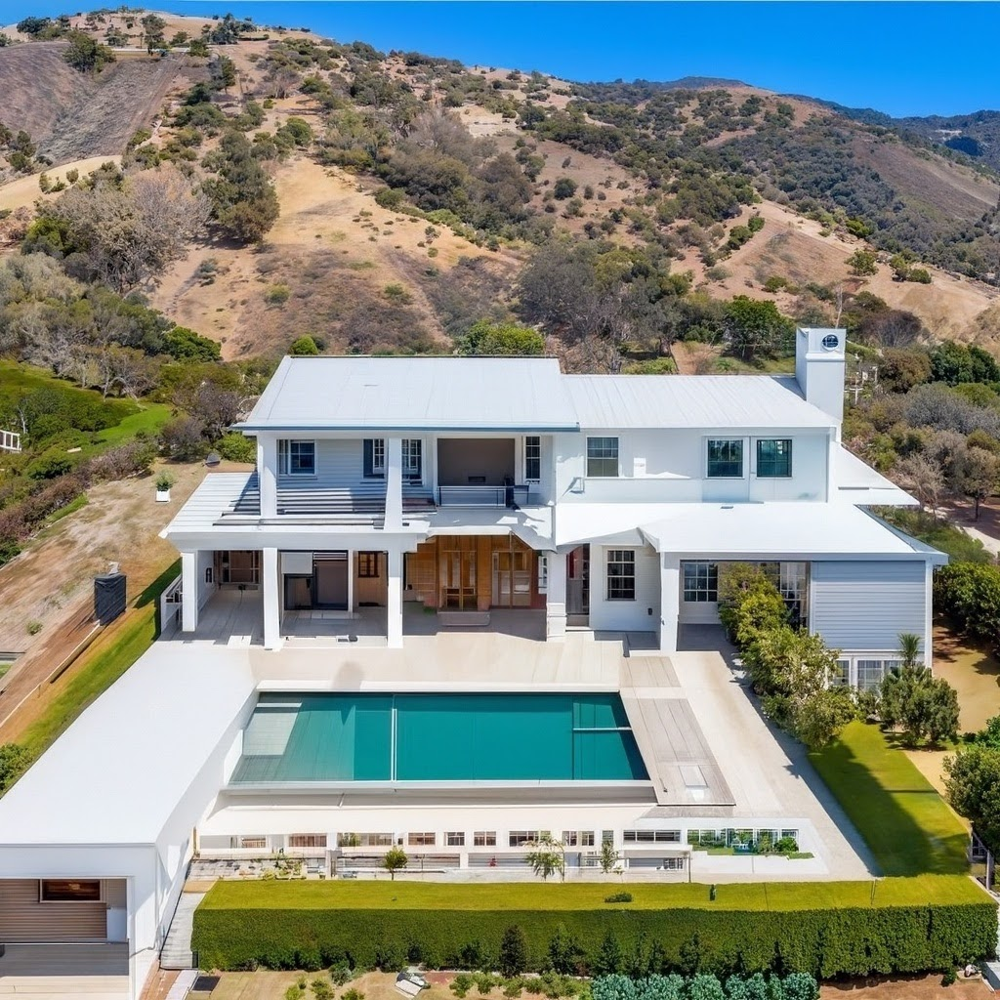

Img_interior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716206941179/sample_0.jpg


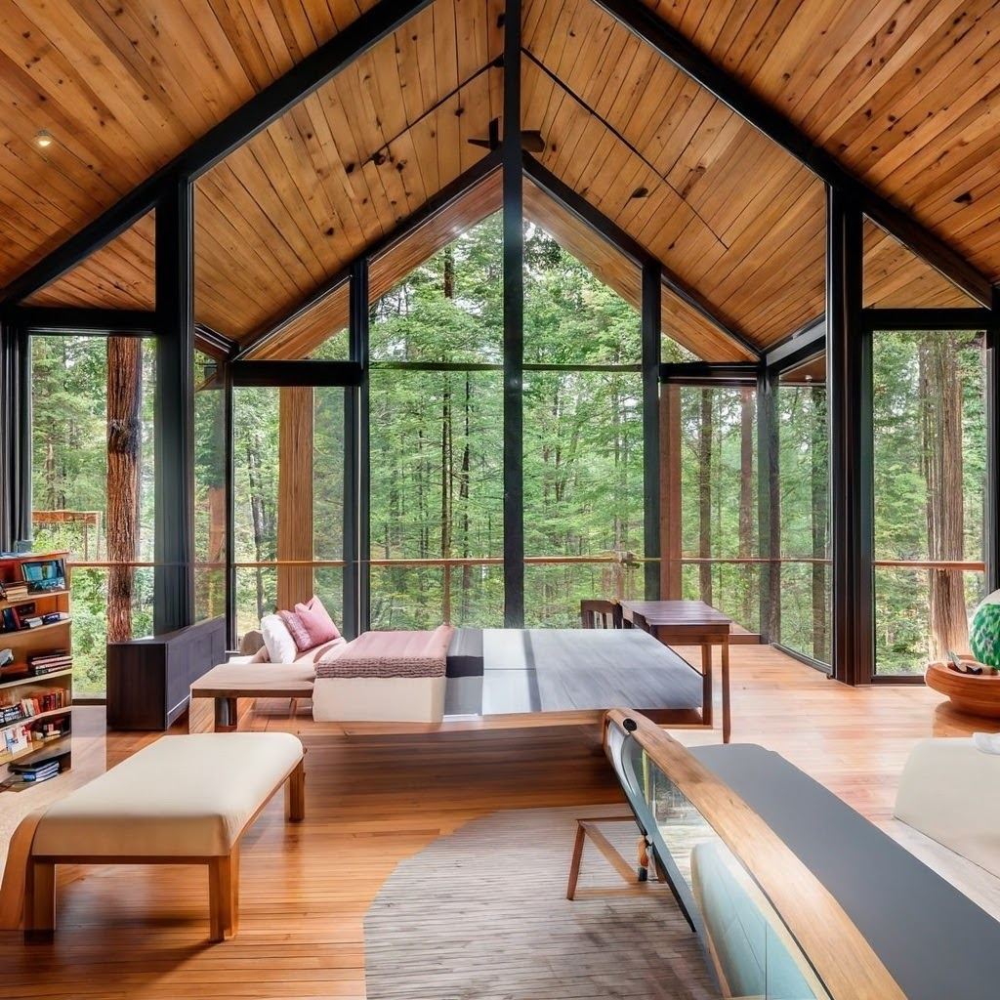

Img_exterior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716206937217/sample_0.jpg


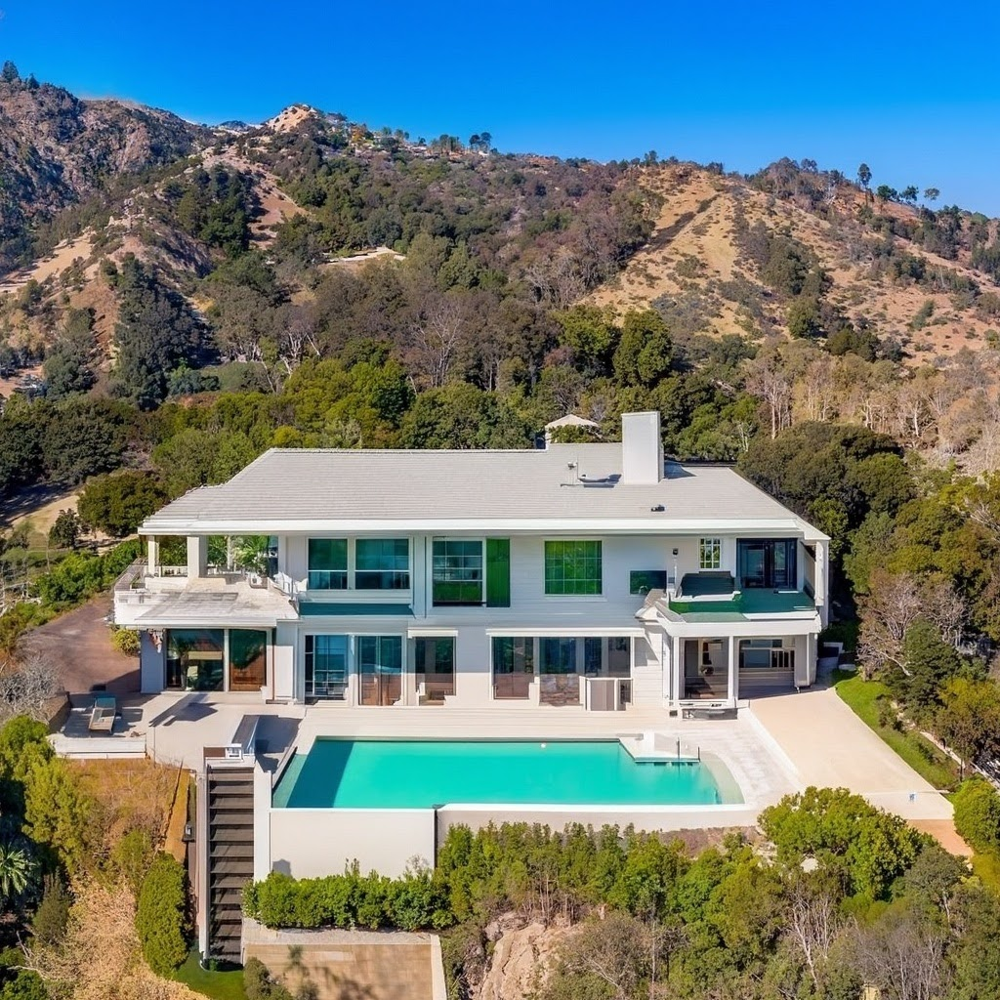

Img_interior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716209144346/sample_0.jpg


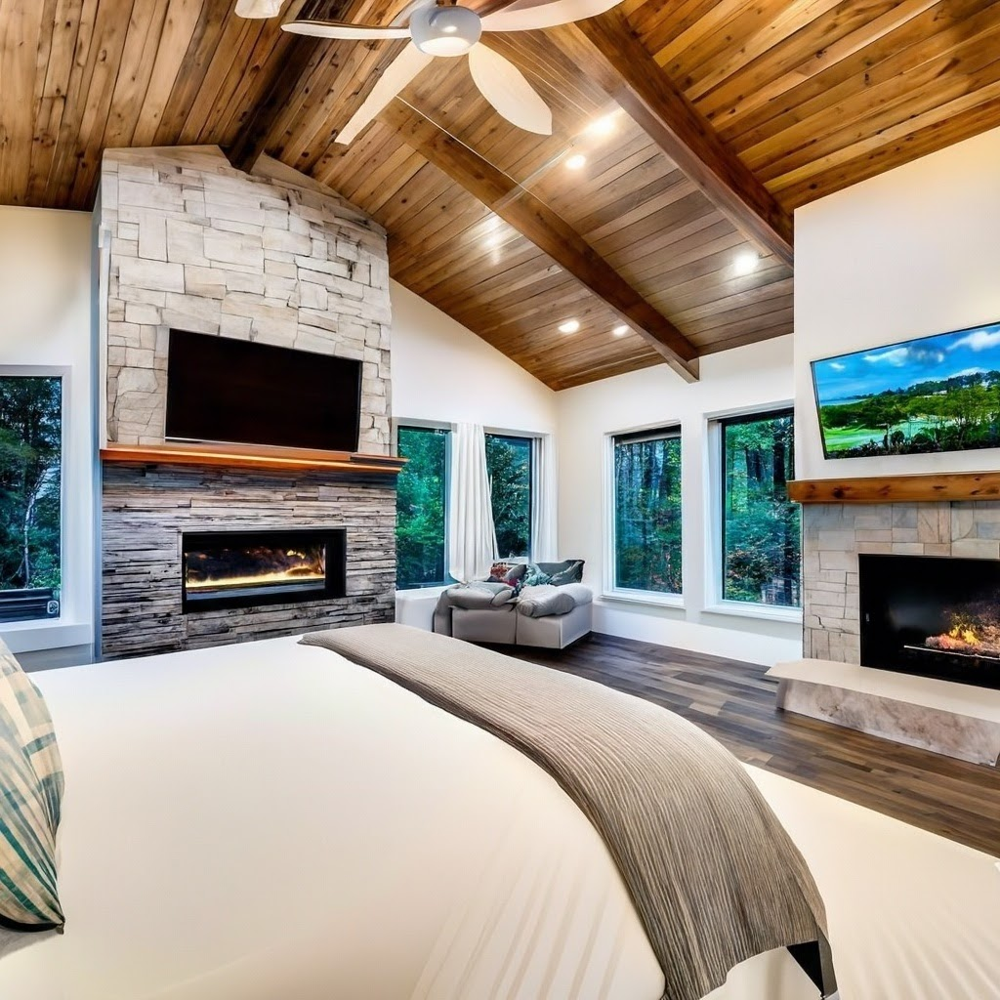

Img_exterior_url_0
https://storage.googleapis.com/vtxdemos-vsearch-airbnb/airbnbimages/1716209139501/sample_0.jpg


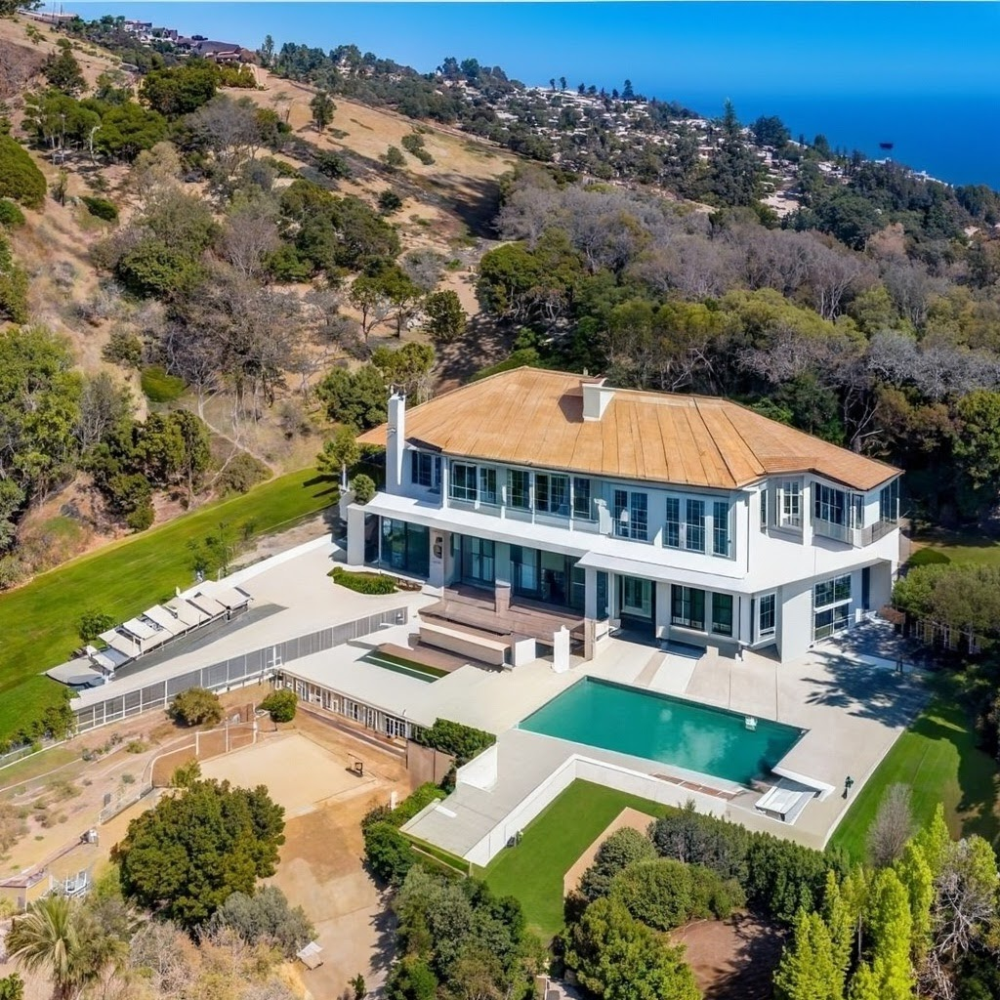

In [22]:
response = requests.get("https://wpcdn.us-midwest-1.vip.tn-cloud.net/www.mountainliving.com/content/uploads/2020/04/PEARSON-CABIN-5710-_sRGB-300DPI.jpg")
img = Img.open(BytesIO(response.content))

for index, row in final_df.iterrows():
    for im in ["Img_interior_url_", "Img_exterior_url_"]:
        for i in range(5):
            print(f"{im}{i}")
            _img = row[f"{im}{i}"]
            print(_img)
            res = requests.get(_img)
            display(Img.open(BytesIO(requests.get(_img).content)))
            break

## Vector Search (Managed Service)

In [23]:
def preprocess(df, f_name):
    df.to_pickle("image_text_data.pkl")
    data = df.to_json(orient='records', lines=True)
    
    with open('image_text_data.json', 'w') as f:
        f.write(data)
        
    storage_client.bucket("vtxdemos-vsearch-datasets").blob(f_name).upload_from_filename("image_text_data.json")
    return data

In [24]:
data_1 = preprocess(emb_df, "abnb_image_text/image_text_data.json")

In [25]:
abnb_index = aiplatform.MatchingEngineIndex.create_tree_ah_index(
    display_name = f"vs-abnb-index-image-text-1",
    contents_delta_uri = "gs://vtxdemos-vsearch-datasets/abnb_image_text",
    dimensions = len(emb_df["embedding"].iloc[0]),
    approximate_neighbors_count = 15,
)

Creating MatchingEngineIndex
Create MatchingEngineIndex backing LRO: projects/254356041555/locations/us-central1/indexes/24404760090116096/operations/3445311198780719104
MatchingEngineIndex created. Resource name: projects/254356041555/locations/us-central1/indexes/24404760090116096
To use this MatchingEngineIndex in another session:
index = aiplatform.MatchingEngineIndex('projects/254356041555/locations/us-central1/indexes/24404760090116096')


In [26]:
abnb_index_endpoint = aiplatform.MatchingEngineIndexEndpoint.create(
    display_name = f"vs-abnb-index-endpoint-image-text-1",
    public_endpoint_enabled = True
)

Creating MatchingEngineIndexEndpoint
Create MatchingEngineIndexEndpoint backing LRO: projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920/operations/2679699262127734784
MatchingEngineIndexEndpoint created. Resource name: projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920
To use this MatchingEngineIndexEndpoint in another session:
index_endpoint = aiplatform.MatchingEngineIndexEndpoint('projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920')


In [27]:
abnb_index_endpoint.deploy_index(
    index = abnb_index, deployed_index_id = "vs_abnb_deployed_image_text_1"
)

Deploying index MatchingEngineIndexEndpoint index_endpoint: projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920
Deploy index MatchingEngineIndexEndpoint index_endpoint backing LRO: projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920/operations/8056997217208107008
MatchingEngineIndexEndpoint index_endpoint Deployed index. Resource name: projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920


resource name: projects/254356041555/locations/us-central1/indexEndpoints/5429850212841553920

In [28]:
emb_df

,id,context,embedding
0,0,"Cozy cabin in Asheville, North Carolina, perfe...","[0.014039430790621412, -0.00168346042705512, 0..."
1,0,"Cozy cabin in Asheville, North Carolina, perfe...","[0.021596122282221963, 0.0038365378085876874, ..."
2,0,"Cozy cabin in Asheville, North Carolina, perfe...","[0.01849404421422946, -0.0013732750595687728, ..."
3,0,"Cozy cabin in Asheville, North Carolina, perfe...","[0.017242981447169358, -0.010324237628616968, ..."
4,0,"Cozy cabin in Asheville, North Carolina, perfe...","[0.018521949193077505, -0.001658438026720552, ..."
...,...,...,...
1215,121,A charming 4-bedroom Forest Retreat in Ashevil...,"[-0.019741440374119977, -0.009294993560866112,..."
1216,121,A charming 4-bedroom Forest Retreat in Ashevil...,"[-0.016617784576691746, -0.007008428607469612,..."
1217,121,A charming 4-bedroom Forest Retreat in Ashevil...,"[-0.010459834363647919, -0.004376016055137875,..."
1218,121,A charming 4-bedroom Forest Retreat in Ashevil...,"[-0.015282022530762671, 0.00419256933292338, 0..."
